# Bayesian Model Free Clustering (時系列データのセグメンテーション)

---

## セットアップ

### モジュールの読み込み

In [1]:
import numpy as np
from tqdm.notebook import tqdm
from matplotlib import pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

### サンプルデータの生成

In [2]:
np.random.seed(0)
X_c0 = np.random.multivariate_normal(np.array(( 0.0,  0.0)), np.array(((1, -0.2), (-0.2, 1))), size = 250)
X_c1 = np.random.multivariate_normal(np.array((-0.1,  0.1)), np.array(((3, -0.2), (-0.2, 3))), size = 200)
X_c2 = np.random.multivariate_normal(np.array(( 0.1, -0.1)), np.array(((2, -0.2), (-0.2, 2))), size = 150)
X = np.cumsum(np.concatenate([X_c0, X_c1, X_c2]), axis = 0) + np.array([[-5, 5]])

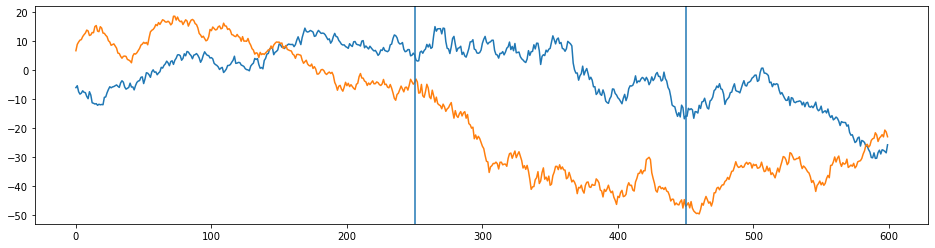

In [3]:
plt.figure(figsize = (16, 4))
plt.plot(X[:, 0])
plt.plot(X[:, 1])
plt.axvline(x = 250)
plt.axvline(x = 450)
plt.show()

---

## Bayesian Model Free Clusteringの実装

In [4]:
class BayesianModelFreeClustering:
    def __init__(
        self,
        num_clusters,
        loss,
        w,
        num_iters_warmup,
        num_iters_sampling,
        random_state = np.random.RandomState(0)
    ):
        self.num_clusters = num_clusters
        self.loss = loss
        self.w = w
        self.num_iters_warmup = num_iters_warmup
        self.num_iters_sampling = num_iters_sampling
        self.random_state = random_state

    def fit_transform(self, X):
        num_points = X.shape[0]
        if num_points < self.num_clusters:
            raise Exception("データ数がクラスター数を下回っています。")

        cluster = np.zeros((num_points, self.num_clusters, self.num_iters_warmup + self.num_iters_sampling))
        loss = np.zeros(self.num_iters_warmup + self.num_iters_sampling)
        border = np.zeros((self.num_clusters + 1, self.num_iters_warmup + self.num_iters_sampling), dtype = int)
        border[-1, :] = num_points

        # MCMC (メトロポリス法)
        for i in tqdm(range(self.num_iters_warmup + self.num_iters_sampling)):
            if i == 0:
                # 初期化
                border[:self.num_clusters, 0] = num_points // self.num_clusters * np.arange(self.num_clusters)
                for k in range(self.num_clusters):
                    cluster[border[k, 0]:border[k + 1, 0], k, 0] = 1
                loss[0] = self.loss(X, cluster[:, :, 0])
            else:
                # ランダムサンプリング
                while True:  # データ数0のクラスターが生じた場合はサンプリングし直す
                    border[:, i] = border[:, i - 1]
                    updated_border_index = self.random_state.randint(low = 1, high = self.num_clusters)
                    shift = np.random.choice([-1, 1])
                    if (border[updated_border_index, i] + shift) * shift < border[updated_border_index + shift, i] * shift:
                        border[updated_border_index, i] = border[updated_border_index, i] + shift
                        break
                for k in range(self.num_clusters):
                    cluster[border[k, i]:border[k + 1, i], k, i] = 1
                loss[i] = self.loss(X, cluster[:, :, i])

                # 更新
                #   条件式1：採択率が100%を超える場合は、常に更新する
                #     採択率が100%を超えるか否かの判定式
                #       π(S) * np.exp(-1 * self.w * loss[i - 1]) < π(S) * np.exp(-1 * self.w * loss[i])
                #   条件式2：採択率が100%を下回る場合は、採択率に従って更新する
                #     採択率の計算式
                #       π(S) * np.exp(-1 * self.w * loss[i]) / π(S) * np.exp(-1 * self.w * loss[i - 1])
                if loss[i] < loss[i - 1] or self.random_state.random_sample() < np.exp(-1 * self.w * (loss[i] - loss[i - 1])):
                    pass
                else:
                    border[:, i] = border[:, i - 1]
                    cluster[:, :, i] = cluster[:, :, i - 1]
                    loss[i] = loss[i - 1]

        return cluster, loss, border

---

## 実行例

In [5]:
def se(X, cluster):
    X_mean = (X[:, np.newaxis, :] * cluster[:, :, np.newaxis]).sum(axis = 0) / cluster.sum(axis = 0)[:, np.newaxis]
    loss = (((X[:, np.newaxis, :] - X_mean[np.newaxis, :, :]) * cluster[:, :, np.newaxis]) ** 2).sum()
    return loss

bmfc = BayesianModelFreeClustering(
    num_clusters = 3,
    loss = se,
    w = 0.001,
    num_iters_warmup = 5000,
    num_iters_sampling = 5000
)

cluster, loss, border = bmfc.fit_transform(X)
p = cluster[:, :, bmfc.num_iters_warmup:].mean(axis = 2)

  0%|          | 0/10000 [00:00<?, ?it/s]

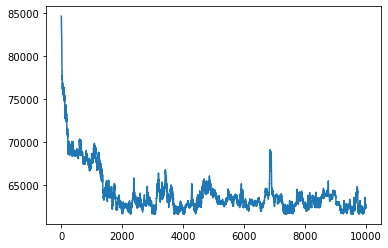

In [6]:
plt.plot(loss)
plt.show()

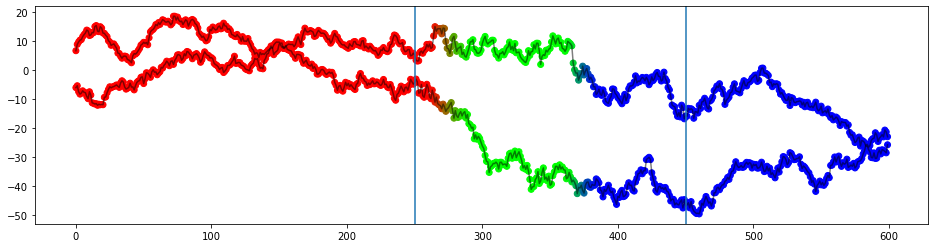

In [7]:
plt.figure(figsize = (16, 4))
plt.plot(X[:, 0], color = "black", alpha = 0.5)
plt.plot(X[:, 1], color = "black", alpha = 0.5)
plt.scatter(np.arange(X.shape[0]), X[:, 0], color = p)
plt.scatter(np.arange(X.shape[0]), X[:, 1], color = p)
plt.axvline(x = 250)
plt.axvline(x = 450)
plt.show()

In [8]:
fig, ax = plt.subplots(figsize = (16, 4))
ax.plot(X[:, 0], color = "black", alpha = 0.5)
ax.plot(X[:, 1], color = "black", alpha = 0.5)
plt.axvline(x = 250, linestyle = "--")
plt.axvline(x = 450, linestyle = "--")
ims = []
for i in range(bmfc.num_iters_warmup + bmfc.num_iters_sampling):
    if i % 100 != 0:
        continue
    a = ax.scatter(np.arange(X.shape[0]), X[:, 0], color = cluster[:, :, :(i + 1)].mean(axis = 2))
    b = ax.scatter(np.arange(X.shape[0]), X[:, 1], color = cluster[:, :, :(i + 1)].mean(axis = 2))
    c = ax.axvline(x = border[1, i])
    d = ax.axvline(x = border[2, i])
    ims.append([a, b, c, d])
ani = animation.ArtistAnimation(fig, ims, interval = 100)
plt.close(fig)

HTML(ani.to_jshtml())

In [11]:
ani.save("bayesian-model-free-clustering-segmentation.gif")

MovieWriter ffmpeg unavailable; using Pillow instead.
